In [1]:
%load_ext autoreload
%autoreload 2

# IBEXtractor 3D 
# IBEX anaysis pipeline for regional and 3D single cell data

# 1. presets and imports 

In [2]:
# %%capture
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tifffile as tf 
import os

In [3]:
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/ImageSpot/')
import imagespot as ims

In [4]:
metapath = '/nfs/team205/ny1/IBEX/Thymus/Sample_07/Thymus Atlas IBEX Image Processing Log - Sample_07_Thy81_Annotations.csv'
parent_directory = os.path.dirname(metapath)
print(parent_directory)


/nfs/team205/ny1/IBEX/Thymus/Sample_07


In [5]:
# load metadata
meta = pd.read_csv(metapath)
meta

,Channel,Channel number,Notes,Marker Name,Simplified Marker Name,Gene Name,Panel,Fluorophore,Include,Unnamed: 9
0,Panel1: CD99 AF647,1,Expressed on granulocytes in the trabeculae,CD99,CD99,CD99,P1,AF647,True,NaN
1,Panel1: CD163 PE,2,"Macrophages in the trabeculae and the CMJ, les...",CD163,CD163,CD163,P1,PE,True,NaN
2,Panel1: Hoechst,3,NaN,Hoechst,HOECHST,NaN,P1,NaN,True,NaN
3,Panel1: CD8 AF488,4,"Polarized on T cells in the medulla, also on s...",CD8,CD8,"CD8A, CD8B",P1,AF488,True,NaN
4,Panel1: CD3 iF594,5,Greatest intensity in the medulla and about th...,CD3,CD3,"CD3E, CD3D, CD3G",P1,iF594,True,NaN
5,Panel1: CD11c AF680,6,"A lot of speckling, artifact from the secondar...",CD11c,CD11C,ITGAX,P1,AF680,True,NaN
6,Panel1: Chromogranin A AF532,7,"No much chromogranin in this sample, a few TEC...",Chromogranin_A,CHROMOGRANIN_A,CHGA,P1,AF532,True,NaN
7,Panel2: CD21 AF532,8,Nothing.,CD21,CD21,CR2,P2,AF532,False,NaN
8,Panel2: Hoechst,9,NaN,Hoechst,HOECHST,NaN,P2,NaN,True,NaN
9,Panel2: CD7 AF555,10,"On T cells in the medulla and cortex, higher i...",CD7,CD7,CD7,P2,AF555,True,NaN


# 2. Get grid Data 
### lest start with the segmentation free data where we simply fit a a grid over the image and measure the mean signal for each channel in the image this expects a single plane image (or Z ptojected seperated by channels to individual files 

In [8]:
path_to_images = parent_directory+'/series/'
nuclear_name = 'HOECHST'
marker_col = 'Simplified Marker Name'
channel_col = 'Channel number'
include_col = 'Include'


Reading image -  ['CD99']
Reading image -  ['CD163']
Reading image -  ['HOECHST']
Reading image -  ['CD8']
Reading image -  ['CD3']
Reading image -  ['CD11C']
Reading image -  ['CHROMOGRANIN_A']
Excluding image -  ['CD21']
Reading image -  ['HOECHST']
Reading image -  ['CD7']
Reading image -  ['CD20']
Reading image -  ['CD34']
Reading image -  ['CD5']
Reading image -  ['CD31']
Reading image -  ['HOECHST']
Reading image -  ['CD4']
Reading image -  ['BETATUB3']
Reading image -  ['VA7.2']
Excluding image -  ['CD25']
Reading image -  ['CD39']
Excluding image -  ['FOXP3']
Reading image -  ['MASKED_FOXP3']
Reading image -  ['HOECHST']
Reading image -  ['HLADR']
Reading image -  ['CD123']
Reading image -  ['CD206']
Reading image -  ['SPARC']
Excluding image -  ['PCP4']
Reading image -  ['LAMIN_A']
Reading image -  ['HOECHST']
Reading image -  ['DEC205']
Reading image -  ['AQUAPORIN_1']
Excluding image -  ['CD138']
Reading image -  ['DESMIN']
Reading image -  ['AIRE']
Reading image -  ['KI-67'

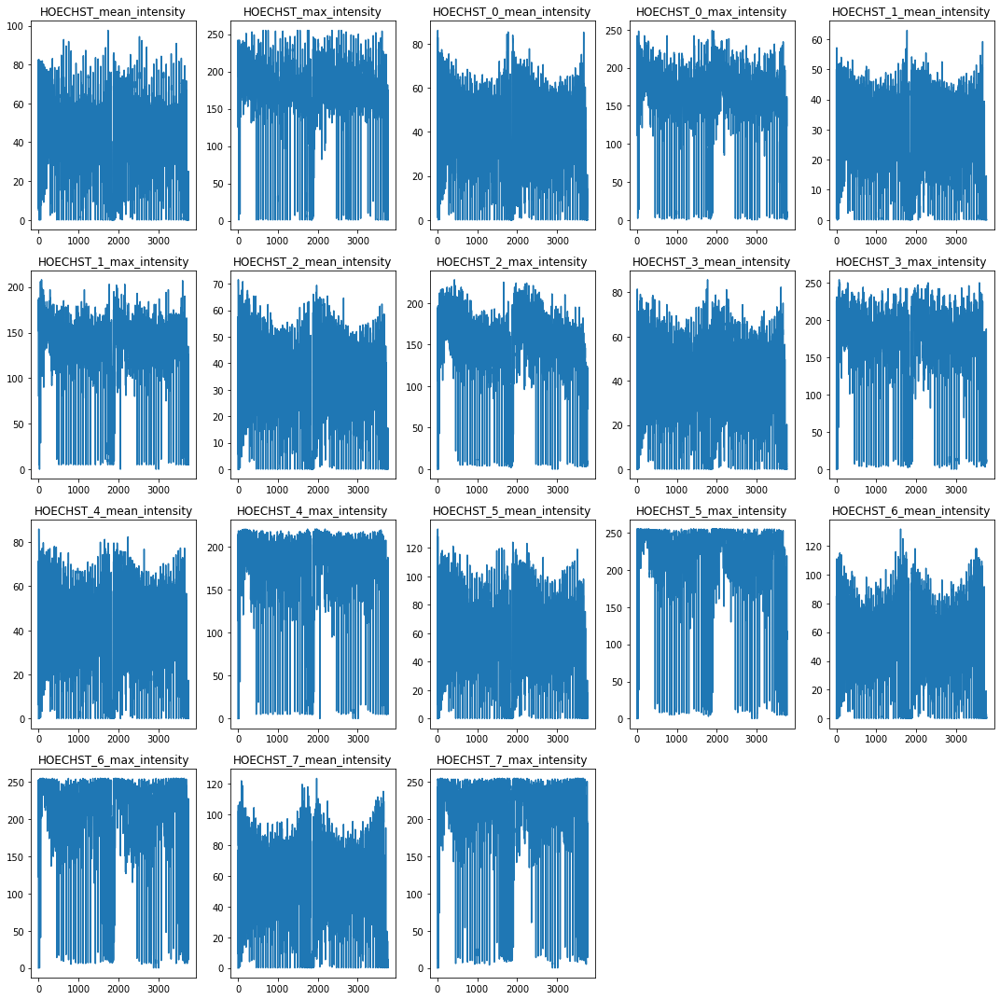

In [9]:
df,ppm = ims.spot_pipeline(
    meta=meta,
    path_to_images=path_to_images,
    marker_col=marker_col,
    channel_col=channel_col,
    nuclear_name = nuclear_name,
    include_col = include_col,
    spot_diameter = 50
)

In [10]:
# save grid spot data
df.to_csv(parent_directory+'/spot_data.csv')

# 3. 3D segmentations


In [29]:
# select the best nuclear channel for cellpose 3D segmentations and save as a 3D array
first_nuclear = meta.loc[meta[marker_col] == nuclear_name, channel_col].iloc[0]
nuclear3D = ims.generate_3d_image(parent_directory+'/series_multiplane/',first_nuclear)
nuclear3D.shape

(7, 15718, 15758)

In [30]:
# subdivide into tiles for computational reasons 
tiles = ims.getTiles(nuclear3D,tilesize=2000) # prepare tiles 
label_image = ims.tile_3d_segmentation(nuclear3D,tiles,ppm=3.52)

generated 64 tiles
[[    0     0  2000  2000]
 [    0  1965  2000  2000]
 [    0  3930  2000  2000]
 [    0  5895  2000  2000]
 [    0  7860  2000  2000]
 [    0  9826  2000  2000]
 [    0 11792  2000  2000]
 [    0 13758  2000  2000]
 [ 1959     0  2000  2000]
 [ 1959  1965  2000  2000]
 [ 1959  3930  2000  2000]
 [ 1959  5895  2000  2000]
 [ 1959  7860  2000  2000]
 [ 1959  9826  2000  2000]
 [ 1959 11792  2000  2000]
 [ 1959 13758  2000  2000]
 [ 3918     0  2000  2000]
 [ 3918  1965  2000  2000]
 [ 3918  3930  2000  2000]
 [ 3918  5895  2000  2000]
 [ 3918  7860  2000  2000]
 [ 3918  9826  2000  2000]
 [ 3918 11792  2000  2000]
 [ 3918 13758  2000  2000]
 [ 5878     0  2000  2000]
 [ 5878  1965  2000  2000]
 [ 5878  3930  2000  2000]
 [ 5878  5895  2000  2000]
 [ 5878  7860  2000  2000]
 [ 5878  9826  2000  2000]
 [ 5878 11792  2000  2000]
 [ 5878 13758  2000  2000]
 [ 7838     0  2000  2000]
 [ 7838  1965  2000  2000]
 [ 7838  3930  2000  2000]
 [ 7838  5895  2000  2000]
 [ 7838  

(7, 15718, 15758)

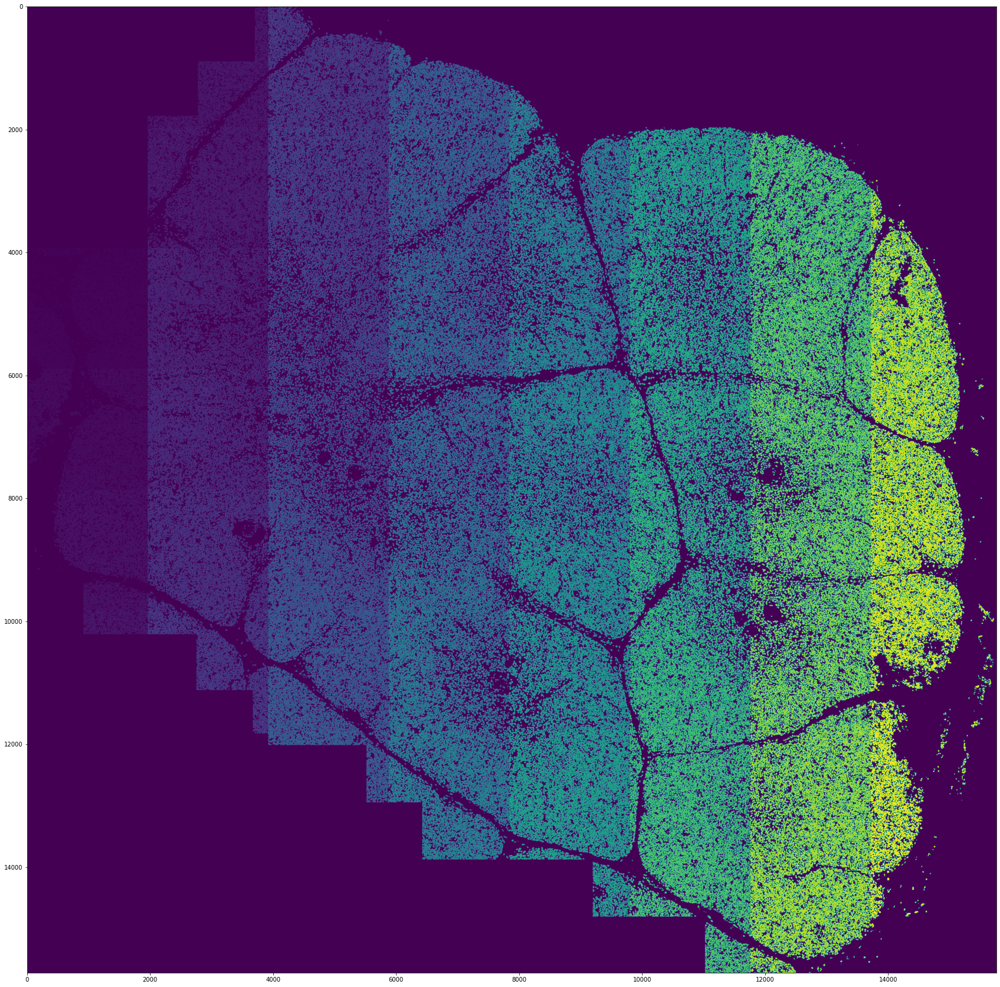

In [31]:
# plot the result
plt.figure(figsize=[30,30])
plt.imshow(label_image[1,:,:]) # plot crop  
label_image.shape

In [32]:
# save segmentations
tf.imwrite(parent_directory+'/Nuclear_segmentation_masks_3D.tif',label_image) # write masks

# 4. Extract 3D channel data

In [6]:
label_image = tf.imread(parent_directory+'/Nuclear_segmentation_masks_3D.tif') # read masks
path_to_images = parent_directory+'/series_multiplane/'
nuclear_name = 'HOECHST'
marker_col = 'Simplified Marker Name'
channel_col = 'Channel number'
include_col = 'Include'
label_image.shape

(7, 15718, 15758)

In [ ]:
# run cell cleanup and channel extraction pipeline
df = ims.cell_pipeline(
    masks=label_image,
    meta=meta,
    path_to_images=path_to_images,
    ppm = 3.52,
    marker_col=marker_col,
    channel_col=channel_col,
    include_col=include_col,
    nuclear_name=nuclear_name,
)

In [8]:
df

,label,centroid-0,centroid-1,centroid-2,area,nuclear_mean_intensity,nuclear_max_intensity,CD99_mean_intensity,CD99_max_intensity,CD163_mean_intensity,...,CD45_mean_intensity,CD45_max_intensity,HOECHST_6_mean_intensity,HOECHST_6_max_intensity,CD15_mean_intensity,CD15_max_intensity,TCRGD_mean_intensity,TCRGD_max_intensity,SYNAPTOPHYSIN_mean_intensity,SYNAPTOPHYSIN_max_intensity
0,10,1.797376,1995.480509,1897.643767,2591,36.062524,151.0,0.938248,19.0,0.060980,...,6.648784,98.0,24.496719,104.0,0.245465,6.0,0.138942,16.0,0.458896,60.0
1,12,3.441552,2004.200884,1862.803536,2036,68.928291,176.0,1.185167,21.0,0.093320,...,22.835462,132.0,39.317289,159.0,0.262770,6.0,0.038310,9.0,0.214637,18.0
2,14,1.797119,2010.953181,1953.678271,833,53.127251,170.0,1.464586,18.0,0.385354,...,41.079232,200.0,46.942377,128.0,0.213685,3.0,0.052821,13.0,0.183673,12.0
3,17,2.564206,2022.358611,1885.274351,2967,56.102797,179.0,1.248062,36.0,0.086957,...,12.288507,145.0,27.540276,153.0,0.102460,3.0,0.011122,7.0,0.058645,8.0
4,19,0.864172,2023.483714,1910.436590,1443,54.601525,163.0,1.744976,40.0,0.180180,...,21.962578,126.0,12.685378,77.0,0.171171,4.0,0.007623,4.0,0.167706,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219386,796672,5.525896,14347.534861,13945.453187,1004,20.144422,66.0,2.021912,18.0,0.025896,...,0.083665,4.0,0.091633,5.0,0.079681,6.0,0.005976,3.0,0.005976,2.0
219387,796674,5.580764,14349.807645,13854.949445,811,49.903822,111.0,2.729963,41.0,0.420469,...,3.203453,57.0,0.739827,21.0,0.119605,13.0,0.000000,0.0,0.000000,0.0
219388,796683,5.512257,14456.059172,13730.437870,1183,63.836855,141.0,2.094675,22.0,0.119189,...,77.208791,255.0,91.819949,232.0,0.234150,6.0,0.041420,6.0,0.168216,7.0
219389,796693,5.593684,14517.221053,13748.174737,950,57.749474,119.0,1.693684,30.0,0.107368,...,36.523158,236.0,33.821053,227.0,0.067368,7.0,0.001053,1.0,0.065263,16.0


In [9]:
df.to_csv(parent_directory+'/channel_data_3d.csv')

# 5. Transfer TissueTag annotations to spot/cell space 

## map pixel-based annotations to hires grid space

In [18]:
# this bit reads the annotation images from "tissuetaged" images and fits an hexagonal grid over the image to sample the observations, the grid resolution is uniquely defined based in the spot diameter (im microns)  
spot_diameter = 15 # in microns
df_morph, ppm_morph = ims.load_and_combine_annotations(
    folder=parent_directory+'/tissue_annotations/',
    file_names=['annotation_lv_0', 'annotation_lv_1'],
    spot_diameter=spot_diameter
)

loaded annotation image - annotation_lv_0 size - (2232, 2238)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotation_lv_0


88804it [00:20, 4300.93it/s]


loaded annotation image - annotation_lv_1 size - (2232, 2238)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotation_lv_1


88804it [00:20, 4303.73it/s]


In [20]:
# calculate minimum mean distance of each spot to cluster. distances are in the grid space scale
ims.dist2cluster_fast(df_morph, annotation='annotation_lv_0', KNN=10) 
ims.dist2cluster_fast(df_morph, annotation='annotation_lv_1', KNN=1) 

calculating distance matrix with cKDTree
Artifacts
Cortex
Edge
Medulla
unassigned
calculating distance matrix with cKDTree
HS
Other
PVS
Vessels
unassigned


{'HS': array([991.40292201, 985.59676089, 979.81306292, ..., 925.70218991,
        932.06092924, 938.43595823]),
 'Other': array([1285.57920858, 1278.6908781 , 1271.80905164, ..., 1961.386635  ,
        1965.17554757, 1968.98546822]),
 'PVS': array([ 702.38932093,  696.73389431,  691.11281474, ..., 1360.46991344,
        1365.09029215, 1369.73576523]),
 'Vessels': array([834.53137125, 828.90362964, 823.30509943, ..., 668.53513625,
        672.97944481, 677.47684711]),
 'unassigned': array([0., 0., 0., ..., 0., 0., 0.])}

## 5.1 - Move morphological annotation to target space - spots

Make sure the coordinate systems are aligned, e.g., axes are not flipped and the resolution is matched.


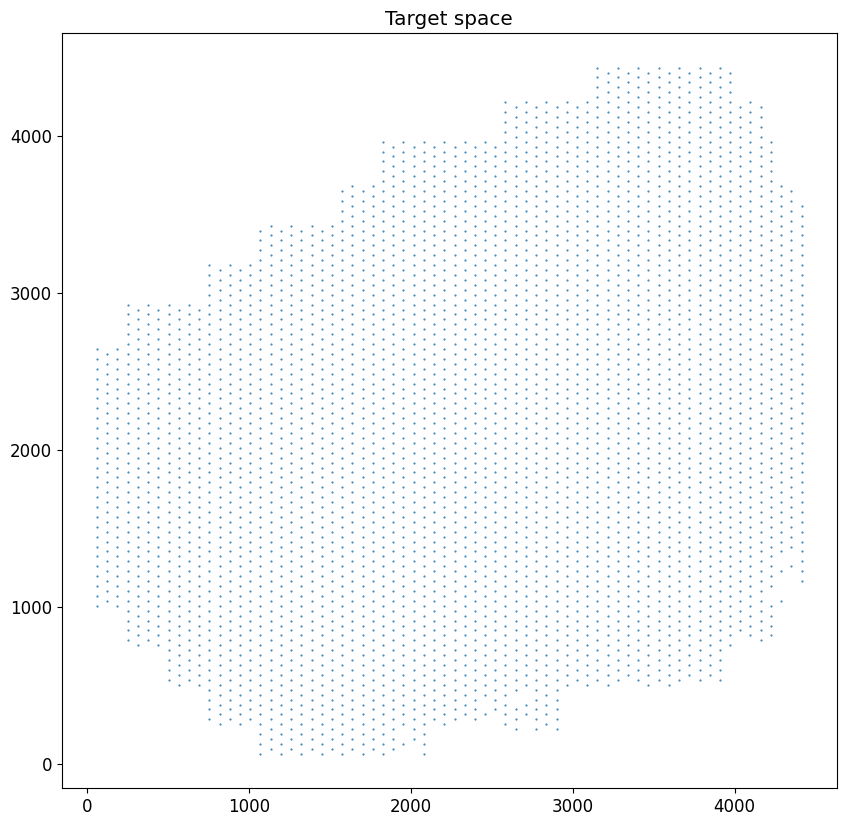

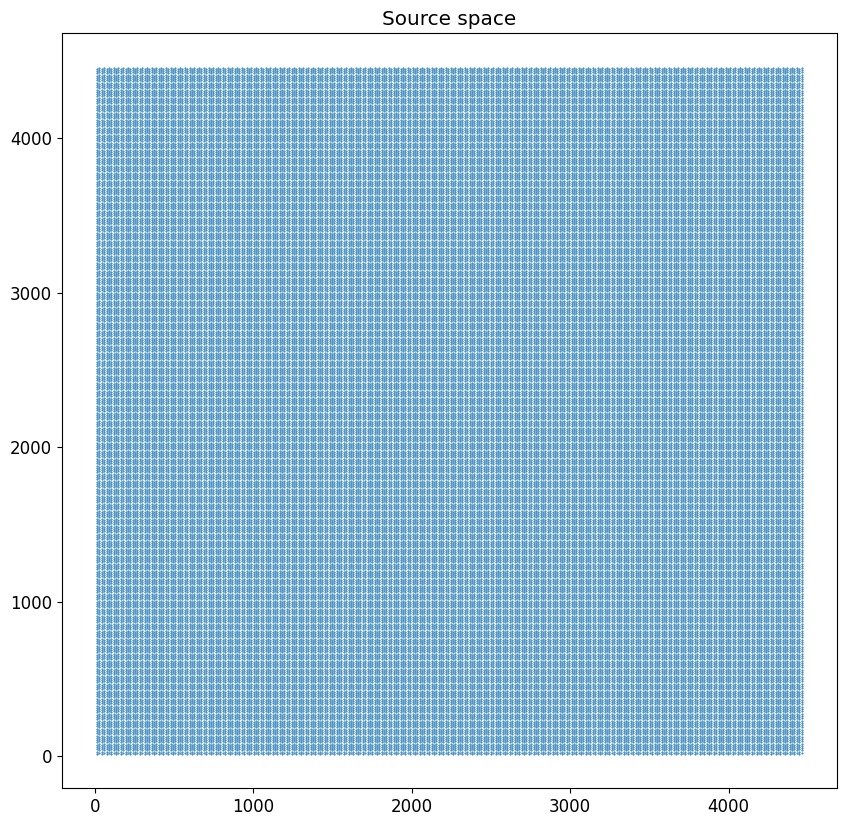

Migrating source annotation - annotation_lv_0 to target space.
Migrating source annotation - annotation_lv_0_number to target space.
Migrating source annotation - annotation_lv_1 to target space.
Migrating source annotation - annotation_lv_1_number to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Artifacts to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Cortex to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Edge to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Medulla to target space.
Migrating source annotation - L2_dist_annotation_lv_0_unassigned to target space.
Migrating source annotation - L2_dist_annotation_lv_1_HS to target space.
Migrating source annotation - L2_dist_annotation_lv_1_Other to target space.
Migrating source annotation - L2_dist_annotation_lv_1_PVS to target space.
Migrating source annotation - L2_dist_annotation_lv_1_Vessels to target space.
Migrating source annotation - L2_

,Unnamed: 0,spot_index,y,x,nuclear_mean_intensity,CD99_mean_intensity,CD99_max_intensity,CD163_mean_intensity,CD163_max_intensity,HOECHST_mean_intensity,...,L2_dist_annotation_lv_0_Artifacts,L2_dist_annotation_lv_0_Cortex,L2_dist_annotation_lv_0_Edge,L2_dist_annotation_lv_0_Medulla,L2_dist_annotation_lv_0_unassigned,L2_dist_annotation_lv_1_HS,L2_dist_annotation_lv_1_Other,L2_dist_annotation_lv_1_PVS,L2_dist_annotation_lv_1_Vessels,L2_dist_annotation_lv_1_unassigned
0,0,16,3543.553548,224.403760,6.215612,0.342269,35.0,0.006815,30.0,6.215612,...,1979.941020,28.396433,59.163997,393.014717,8.876609,657.418223,833.994254,373.877475,533.665542,0.0
1,1,17,3764.883693,224.390064,82.537279,5.831277,50.0,0.157196,62.0,82.537279,...,1979.871537,8.876610,31.035591,375.170854,19.398821,644.925766,809.172235,356.795267,515.178668,0.0
2,2,18,3986.168174,224.416116,48.300874,5.666869,82.0,1.393387,189.0,48.300874,...,1980.250954,17.261974,10.103158,358.926816,19.389295,633.595182,784.701286,340.538625,497.797448,0.0
3,3,19,4207.424326,224.416371,8.528020,6.060321,254.0,2.595815,180.0,8.528020,...,1981.345937,50.654721,34.890449,341.178280,8.876598,621.162060,754.658224,322.903198,477.808836,0.0
4,4,20,4428.754875,224.396723,4.887555,3.582966,181.0,0.321430,67.0,4.887555,...,1982.727408,78.434801,57.633274,329.112453,8.876598,612.672689,731.106931,311.307515,463.364253,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3758,3758,4882,11622.300778,15533.571077,12.444580,1.582276,113.0,0.176459,79.0,12.444580,...,60.818018,162.129863,151.923894,453.580248,8.876637,515.265158,1723.394727,1083.659112,518.197213,0.0
3759,3759,4883,11843.593965,15533.592368,0.000025,0.515165,38.0,0.000000,0.0,0.000025,...,66.411227,182.507603,173.631016,464.959915,8.876635,528.926054,1731.072370,1091.651061,521.137144,0.0
3760,3760,4884,12064.923482,15533.607834,0.108316,0.557920,32.0,0.003142,23.0,0.108316,...,72.060058,172.714954,159.857167,460.333494,8.876635,547.814678,1741.341910,1102.696994,514.411121,0.0
3761,3761,4885,12286.197502,15533.582497,0.000051,0.493792,24.0,0.000000,0.0,0.000051,...,76.907169,163.611902,145.894784,451.179726,8.876637,564.249369,1750.087314,1112.356713,510.933132,0.0


In [34]:
# map annotations to channel data - in this step the df can contain any sort if informationm either cells or spots, you inly need to make sure the columns of the xy coordinates would be labeled as 'x' and 'y'
df_ibex_spot = pd.read_csv(parent_directory + '/spot_data.csv') # read target data 
df_ibex_spot.rename(columns={'centroid_y':'y','centroid_x':'x'},inplace=True) # rename the xy coordinates 
ims.map_annotations_to_target(df_source=df_morph, df_target=df_ibex_spot, ppm_source=ppm_morph,ppm_target=3.52)

## axis part

In [23]:
# axis calculations on visium 
anno = 'annotation_lv_0'
structure = ['Edge','Cortex','Medulla']
w = [0.2,0.8]
df_ibex_spot = ims.calculate_axis_3p(df_ibex_spot, anno=anno, structure=structure, output_col='cma_v2', w=w)


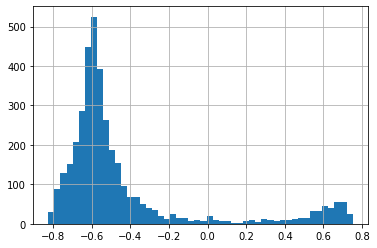

In [24]:
import seaborn as sns
ct_order = ['Capsular','Sub-Capsular','Cortical level I','Cortical level II','Cortical level III','Cortical CMJ','Medullar CMJ','Medullar level I','Medullar level II','Medullar level III','Medullar Deep']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
ct2_values = [-0.7,-0.6,-0.55,-0.4,-0.3,0.1,0.55,0.65,0.7,0.74]

df_ibex_spot = ims.bin_axis(ct_order ,ct2_values,df_ibex_spot,'cma_v2')   
df_ibex_spot.loc[df_ibex_spot[anno]=='Edge','manual_bin_cma_v2'] = 'Capsular'
df_ibex_spot['manual_bin_cma_v2'].value_counts()
df_ibex_spot['cma_v2'].hist(bins=50)
plt.show()

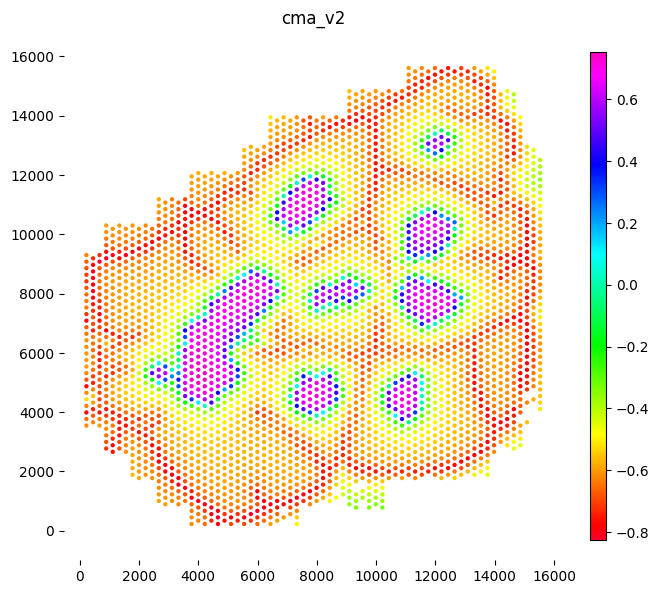

(-541.0709458980573,
 16299.071273936977,
 -544.9159960209539,
 16374.867834137174)

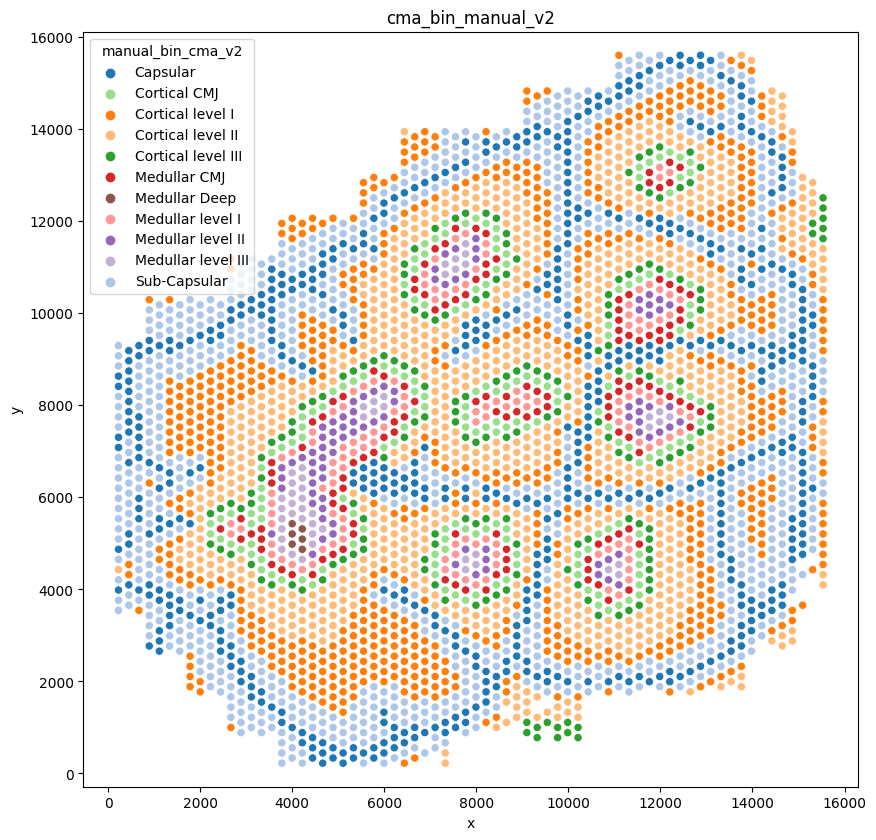

In [25]:

# plotting 
plt.figure(dpi=100, figsize=[7,7])
plt.scatter(df_ibex_spot['x'],df_ibex_spot['y'],c=df_ibex_spot['cma_v2'],cmap='gist_rainbow',s=3.52*5,marker='.')
plt.grid(False)
plt.title('cma_v2')
plt.colorbar(aspect=30,fraction=0.03)
plt.axis('equal')
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
plt.show()

plt.figure(dpi=100, figsize=[10,10])
sns.scatterplot(x=df_ibex_spot['x'],y=df_ibex_spot['y'],hue=df_ibex_spot['manual_bin_cma_v2'],palette=ct_color_map,s=3.52*10,)
plt.grid(False)
plt.title('cma_bin_manual_v2')
plt.axis('equal')


In [26]:
df_ibex_spot.to_csv(parent_directory+'/spot_data_anno.csv')

## 5.2 - Move morphological annotation to target space - cells

Make sure the coordinate systems are aligned, e.g., axes are not flipped and the resolution is matched.


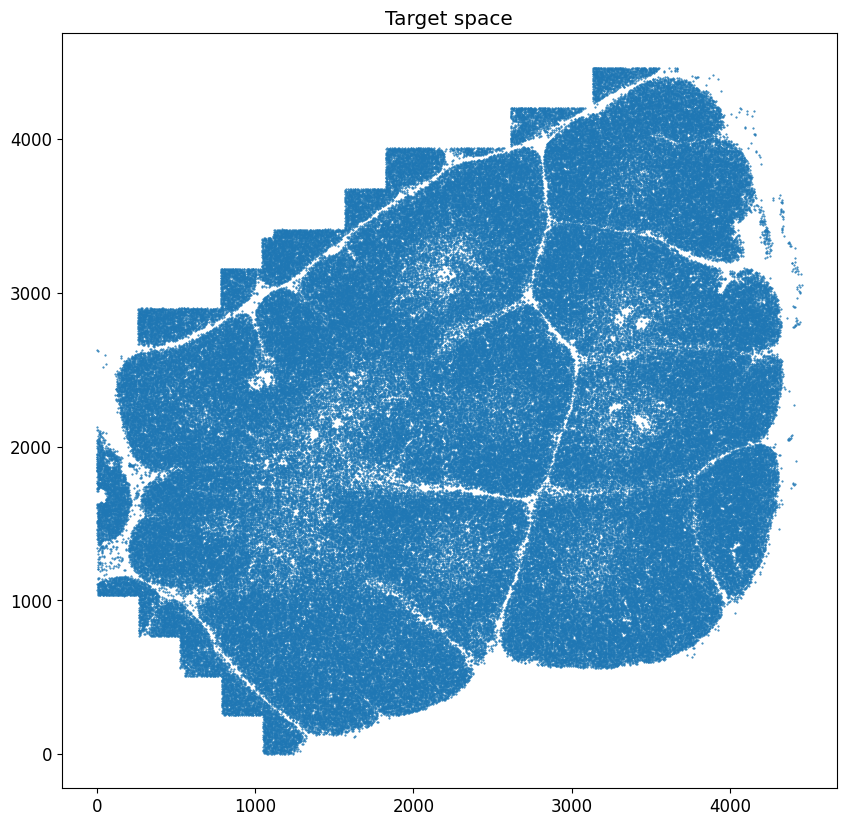

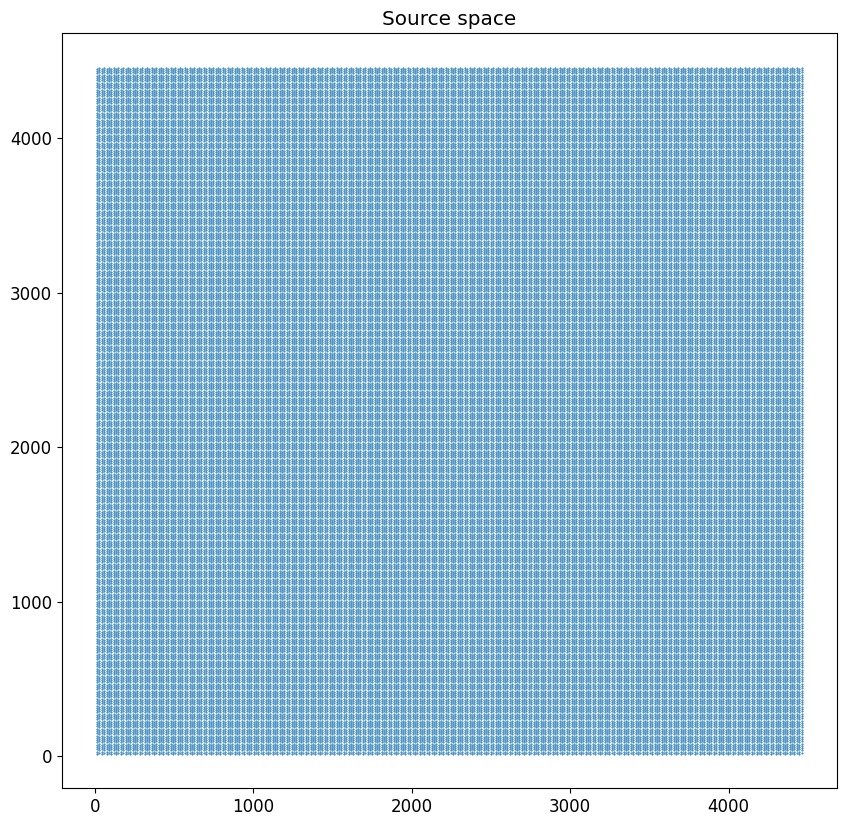

Migrating source annotation - annotation_lv_0 to target space.
Migrating source annotation - annotation_lv_0_number to target space.
Migrating source annotation - annotation_lv_1 to target space.
Migrating source annotation - annotation_lv_1_number to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Artifacts to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Cortex to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Edge to target space.
Migrating source annotation - L2_dist_annotation_lv_0_Medulla to target space.
Migrating source annotation - L2_dist_annotation_lv_0_unassigned to target space.
Migrating source annotation - L2_dist_annotation_lv_1_HS to target space.
Migrating source annotation - L2_dist_annotation_lv_1_Other to target space.
Migrating source annotation - L2_dist_annotation_lv_1_PVS to target space.
Migrating source annotation - L2_dist_annotation_lv_1_Vessels to target space.
Migrating source annotation - L2_

,Unnamed: 0,label,centroid-0,y,x,area,nuclear_mean_intensity,nuclear_max_intensity,CD99_mean_intensity,CD99_max_intensity,...,L2_dist_annotation_lv_0_Artifacts,L2_dist_annotation_lv_0_Cortex,L2_dist_annotation_lv_0_Edge,L2_dist_annotation_lv_0_Medulla,L2_dist_annotation_lv_0_unassigned,L2_dist_annotation_lv_1_HS,L2_dist_annotation_lv_1_Other,L2_dist_annotation_lv_1_PVS,L2_dist_annotation_lv_1_Vessels,L2_dist_annotation_lv_1_unassigned
0,0,10,1.797376,1995.480509,1897.643767,2591,36.062524,151.0,0.938248,19.0,...,1757.293811,17.934316,114.441112,424.337386,9.538360,615.797415,943.377132,325.774743,457.468133,0.0
1,1,12,3.441552,2004.200884,1862.803536,2036,68.928291,176.0,1.185167,21.0,...,1764.212682,22.462521,119.248581,425.391817,8.876603,617.211409,941.656668,327.379442,459.294598,0.0
2,2,14,1.797119,2010.953181,1953.678271,833,53.127251,170.0,1.464586,18.0,...,1749.384029,12.199144,106.218890,417.174606,12.705858,608.435042,937.960833,318.355983,449.928543,0.0
3,3,17,2.564206,2022.358611,1885.274351,2967,56.102797,179.0,1.248062,36.0,...,1756.275154,16.098395,110.960953,418.099884,9.689445,609.750405,936.143546,319.819371,451.645428,0.0
4,4,19,0.864172,2023.483714,1910.436590,1443,54.601525,163.0,1.744976,40.0,...,1756.275154,16.098395,110.960953,418.099884,9.689445,609.750405,936.143546,319.819371,451.645428,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219386,219386,796672,5.525896,14347.534861,13945.453187,1004,20.144422,66.0,2.021912,18.0,...,232.524899,31.550466,20.647604,263.558016,8.876592,656.575585,1659.760750,1057.938557,365.628488,0.0
219387,219387,796674,5.580764,14349.807645,13854.949445,811,49.903822,111.0,2.729963,41.0,...,239.618997,22.245792,10.513536,251.774630,15.719082,651.092245,1646.748655,1046.330876,353.792692,0.0
219388,219388,796683,5.512257,14456.059172,13730.437870,1183,63.836855,141.0,2.094675,22.0,...,260.074903,10.337730,15.349940,250.351553,30.746377,659.989752,1641.290065,1044.457053,351.994349,0.0
219389,219389,796693,5.593684,14517.221053,13748.174737,950,57.749474,119.0,1.693684,30.0,...,266.492037,10.337694,15.349923,255.508459,32.207689,667.043679,1645.087909,1049.327121,357.023637,0.0


In [35]:
# map annotations to channel data - in this step the df can contain any sort if informationm either cells or spots, you inly need to make sure the columns of the xy coordinates would be labeled as 'x' and 'y'
df_ibex_cell = pd.read_csv(parent_directory + '/channel_data_3d.csv') # read target data 
df_ibex_cell.rename(columns={'centroid-1':'y','centroid-2':'x'},inplace=True) # rename the xy coordinates 
ims.map_annotations_to_target(df_source=df_morph, df_target=df_ibex_cell, ppm_source=ppm_morph,ppm_target=3.52)

## axis part

In [29]:
# axis calculations on visium 
anno = 'annotation_lv_0'
structure = ['Edge','Cortex','Medulla']
w = [0.2,0.8]
df_ibex_cell = ims.calculate_axis_3p(df_ibex_cell, anno=anno, structure=structure, output_col='cma_v2', w=w)


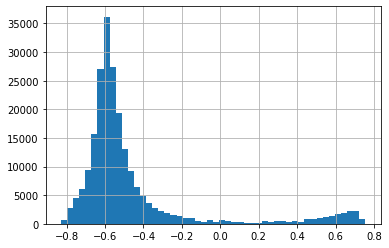

In [30]:
import seaborn as sns
ct_order = ['Capsular','Sub-Capsular','Cortical level I','Cortical level II','Cortical level III','Cortical CMJ','Medullar CMJ','Medullar level I','Medullar level II','Medullar level III','Medullar Deep']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
ct2_values = [-0.7,-0.6,-0.55,-0.4,-0.3,0.1,0.55,0.65,0.7,0.74]

df_ibex_cell = ims.bin_axis(ct_order ,ct2_values,df_ibex_cell,'cma_v2')   
df_ibex_cell.loc[df_ibex_cell[anno]=='Edge','manual_bin_cma_v2'] = 'Capsular'
df_ibex_cell['manual_bin_cma_v2'].value_counts()
df_ibex_cell['cma_v2'].hist(bins=50)
plt.show()

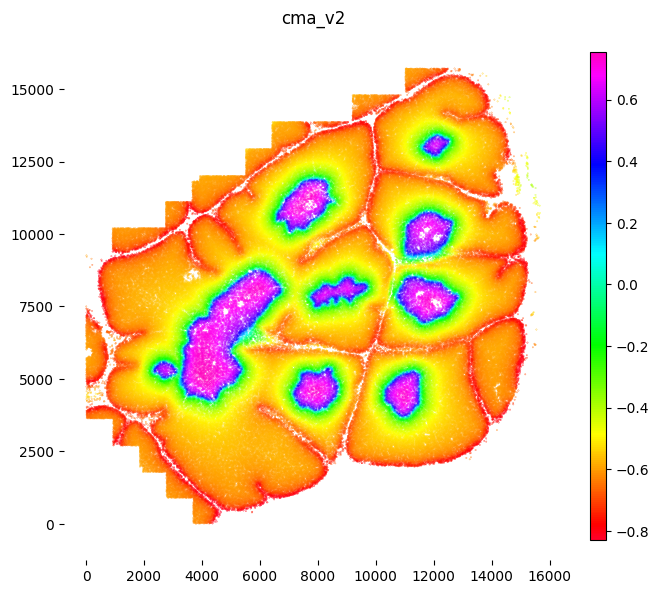

(-773.6926011250863, 16452.99996513294, -776.7999475557223, 16497.677190485112)

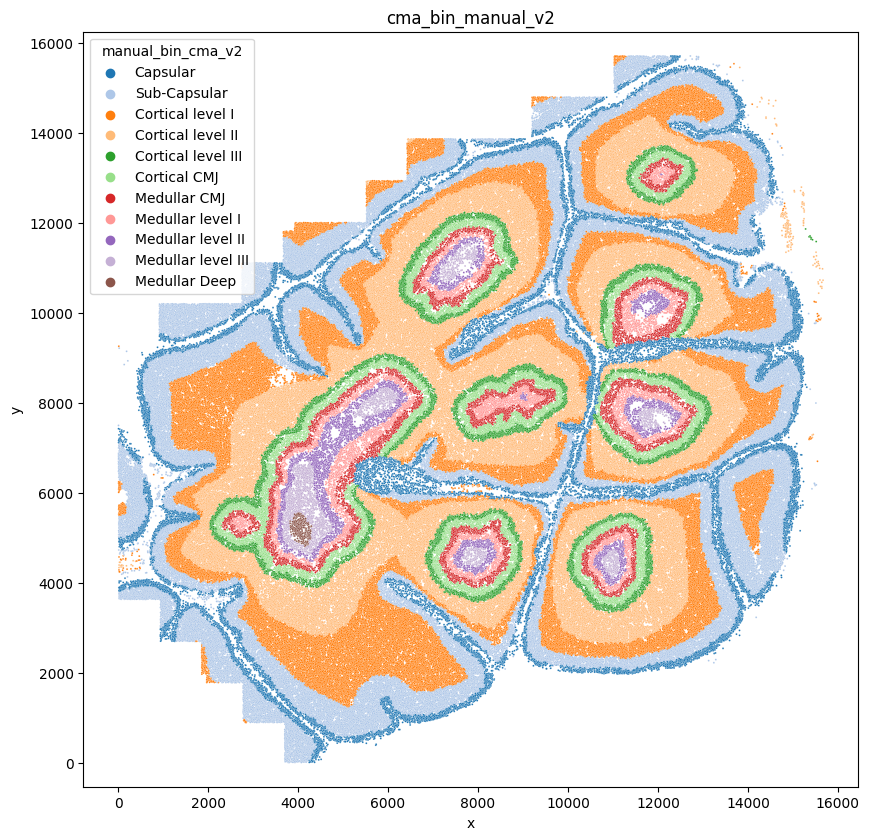

In [31]:

# plotting 
plt.figure(dpi=100, figsize=[7,7])
plt.scatter(df_ibex_cell['x'],df_ibex_cell['y'],c=df_ibex_cell['cma_v2'],cmap='gist_rainbow',s=3.52*0.05,marker='.')
plt.grid(False)
plt.title('cma_v2')
plt.colorbar(aspect=30,fraction=0.03)
plt.axis('equal')
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
plt.show()

plt.figure(dpi=100, figsize=[10,10])
sns.scatterplot(x=df_ibex_cell['x'],y=df_ibex_cell['y'],hue=df_ibex_cell['manual_bin_cma_v2'],palette=ct_color_map,s=3.52*0.5,hue_order=ct_order)
plt.grid(False)
plt.title('cma_bin_manual_v2')
plt.axis('equal')


In [32]:
df_ibex_cell.to_csv(parent_directory+'/channel_data_3d_anno.csv')

In [33]:
parent_directory

'/nfs/team205/ny1/IBEX/Thymus/Sample_07'

# 6 - (optional) extract nuclear morphology features from nuclear staining
This section is to perform a basic feature extraction from nuclear morphology based on the 

(7, 200, 200)

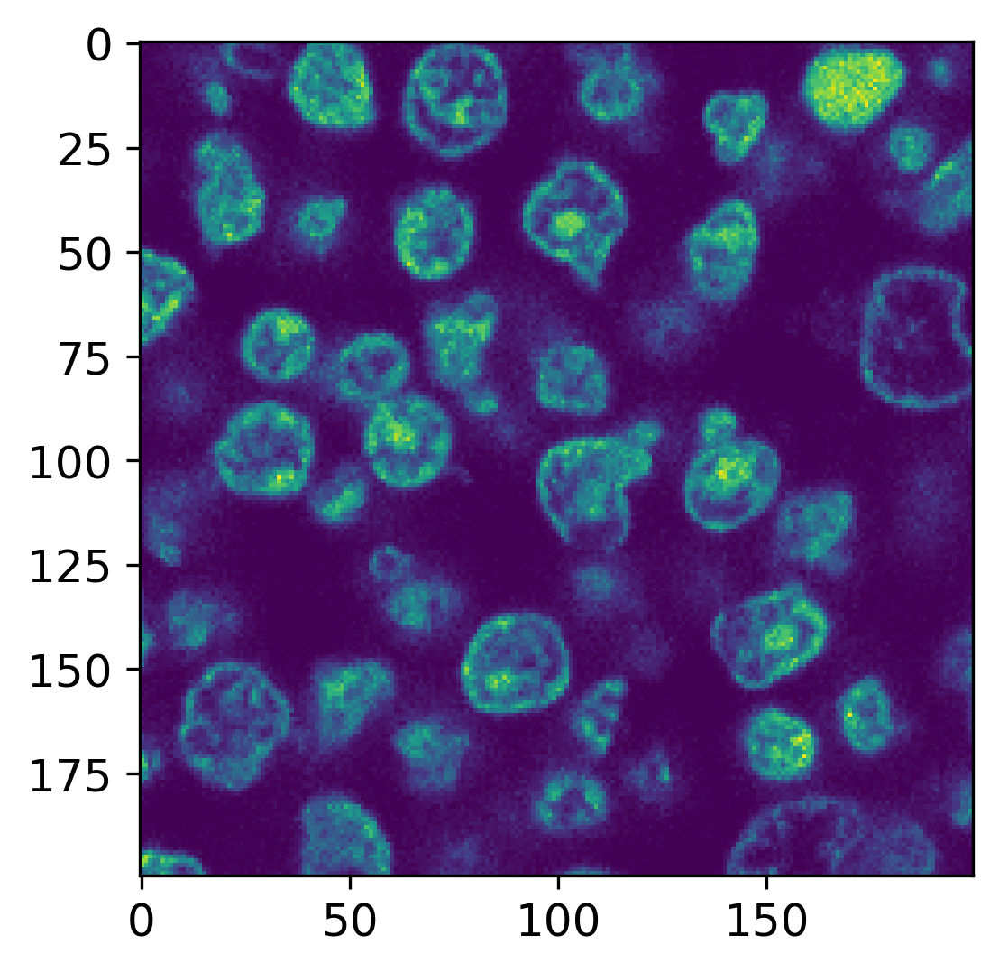

In [80]:
path_to_images = parent_directory+'/series/'
nuclear_name = 'HOECHST'
marker_col = 'Simplified Marker Name'
channel_col = 'Channel number'
include_col = 'Include'
# select the best nuclear channel for cellpose 3D segmentations and save as a 3D array
first_nuclear = meta.loc[meta[marker_col] == nuclear_name, channel_col].iloc[0]
nuclear3D = ims.generate_3d_image(parent_directory+'/series_multiplane/',first_nuclear)
nuclear3D = nuclear3D[:,5000:5200,5000:5200]
nuclear3D.shape
# plot
plt.figure(figsize=[4,4])
# nuclear3D = nuclear3D[1,:,:]
plt.imshow(nuclear3D[1,:,:]) # plot crop  
nuclear3D.shape

(7, 200, 200)

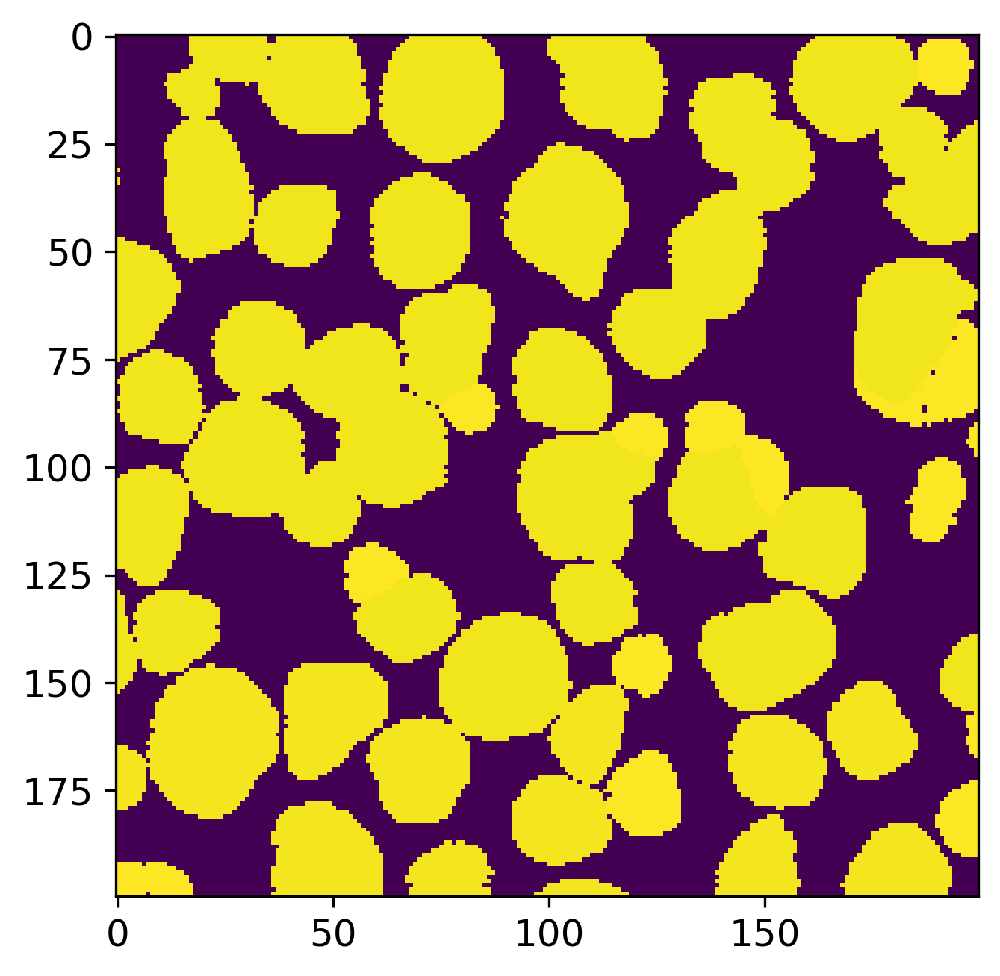

In [79]:
## read segmentation image  
label_image = tf.imread(parent_directory+'/Nuclear_segmentation_masks_3D.tif') # read masks
# label_image = label_image[1,:,:]
label_image = label_image[:,5000:5200,5000:5200]
# plot
plt.figure(figsize=[5,5])
plt.imshow(label_image[1,:,:]) # plot crop  
label_image.shape

In [87]:
# df = ims.get_all_properties_2d(label_image, nuclear3D,feature_categories=['shape', 'texture', 'lbp'])
# df = ims.get_all_properties_2d(label_image, nuclear3D)
# dfseg_nuc = ims.get_all_properties_2d(label_image, nuclear3D)
df = ims.get_all_properties_3d(label_image, nuclear3D,dim_order='zyx')

Texture features for slice 0: 2.373260259628296 seconds, 13 features
Shape features for slice 0: 0.11059761047363281 seconds, 8 features
Intensity features for slice 0: 0.08203125 seconds, 6 features
Frequency features for slice 0: 0.045024871826171875 seconds, 4 features
Lbp features for slice 0: 0.0547792911529541 seconds, 3 features
Gabor features for slice 0: 0.06197547912597656 seconds, 3 features
Texture features for slice 1: 2.3580753803253174 seconds, 13 features
Shape features for slice 1: 0.11473798751831055 seconds, 8 features
Intensity features for slice 1: 0.08254003524780273 seconds, 6 features
Frequency features for slice 1: 0.044475555419921875 seconds, 4 features
Lbp features for slice 1: 0.05249309539794922 seconds, 3 features
Gabor features for slice 1: 0.06589698791503906 seconds, 3 features
Texture features for slice 2: 2.366250991821289 seconds, 13 features
Shape features for slice 2: 0.10024333000183105 seconds, 8 features
Intensity features for slice 2: 0.115072

In [89]:
df

,label,area_min,eccentricity_min,extent_min,kurtosis_intensity_min,major_axis_length_min,mean_gabor_min,mean_intensity_min,mean_lbp_min,mean_spectrum_min,...,texture_ASM_2_mean,texture_contrast_0_mean,texture_contrast_1_mean,texture_contrast_2_mean,texture_correlation_0_mean,texture_correlation_1_mean,texture_correlation_2_mean,texture_dissimilarity_0_mean,texture_dissimilarity_1_mean,texture_dissimilarity_2_mean
0,181610,2.0,1.000000,1.000000,-2.000000,2.000000,0.000000,6.000000,2.000000,90.0,...,0.999899,0.002261,0.002273,0.002273,1.000000,1.000000,1.000000,0.000302,0.000303,0.000303
1,181621,349.0,0.435526,0.677037,-0.877097,25.564639,19.252593,24.879650,125.197143,481691.0,...,0.974352,3.648693,4.081999,4.081999,0.936508,0.923022,0.923022,0.154359,0.164851,0.164851
2,181622,137.0,0.740313,0.913333,1.431913,16.332270,12.273333,15.854015,111.800000,44721.0,...,0.993043,0.188543,0.234034,0.234034,0.911625,0.882156,0.882156,0.021307,0.022626,0.022626
3,181626,167.0,0.800169,0.632576,0.205747,19.791190,35.421053,22.191011,113.894737,204446.0,...,0.991182,1.902638,1.514924,1.514924,0.877167,0.885992,0.885992,0.062864,0.060011,0.060011
4,181633,220.0,0.360281,0.718954,-1.201772,17.506451,8.119281,10.254545,119.266975,31821.0,...,0.978367,4.933451,5.910890,5.910890,0.934001,0.917744,0.917744,0.160025,0.174991,0.174991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197,195466,378.0,0.544296,0.715909,-0.441525,24.615105,31.428977,21.208995,128.085227,281066.0,...,0.979551,1.308241,1.757834,1.757834,0.891179,0.854507,0.854507,0.082714,0.097876,0.097876
198,195497,74.0,0.892528,0.560606,-0.697654,14.610026,61.897727,34.351351,110.530303,194410.0,...,0.995762,0.861256,0.695033,0.695033,0.868630,0.894514,0.894514,0.033166,0.030151,0.030151
199,195515,618.0,0.621798,0.762963,-1.140121,31.934237,28.761111,36.516181,129.093827,1153937.0,...,0.966797,2.529246,3.413348,3.413348,0.955667,0.940466,0.940466,0.155276,0.182874,0.182874
200,195525,612.0,0.701682,0.624490,1.739952,34.101105,45.295408,25.763072,138.565306,806509.0,...,0.967641,3.864020,4.761698,4.761698,0.870766,0.841531,0.841531,0.184422,0.203783,0.203783


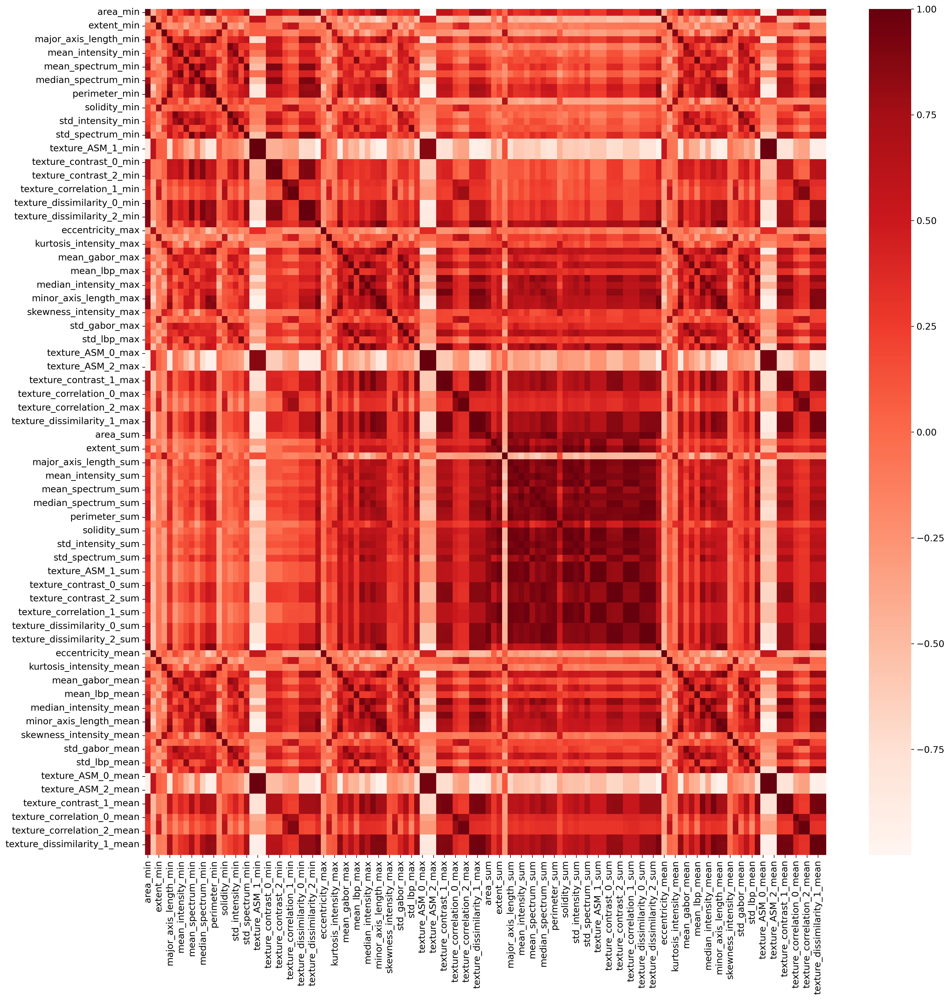

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

# Let's assume df is your DataFrame
correlation_matrix = df.drop(columns=['label']).corr()

plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=False, cmap=plt.cm.Reds)
plt.show()